This notebook is based on the notebook for FastAI Practical Deep Learning for Coders: Part 2 Lesson 10. 

It's not really from Stable Diffusion from scratch, but instead we will develop the diffusion model from its component parts on Huggingface. Some content, including text explanations, was copied from the official Huggingface [blog post](https://huggingface.co/blog/stable_diffusion).

See also: [FastAI notebook on GitHub](https://github.com/fastai/diffusion-nbs/blob/master/stable_diffusion.ipynb)

## What is Stable Diffusion

There are three main components in latent diffusion.

1. An autoencoder (VAE).
2. A [U-Net](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb#scrollTo=wW8o1Wp0zRkq).
3. A text-encoder, *e.g.* [CLIP's Text Encoder](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

The output of the U-Net, being the noise residual, is used to compute a denoised latent image representation via a scheduler algorithm. Many different scheduler algorithms can be used for this computation, each having its pros and cons. For Stable Diffusion, we recommend using one of:

- [PNDM scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_pndm.py) (used by default)
- [DDIM scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_ddim.py)
- [K-LMS scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_lms_discrete.py)

To make things a bit different, we'll use another scheduler. The standard pipeline uses the [PNDM Scheduler](https://arxiv.org/abs/2202.09778), but we'll use [Katherine Crowson's](https://github.com/crowsonkb) excellent K-LMS scheduler.

We need to be careful to use the same noising schedule that was used during training. The schedule is defined by the number of noising steps and the amount of noise added at each step, which is derived from the _beta_ parameters.

## Set up environment

In [227]:
# Kaggle Python 3 environment is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [228]:
# Installations and imports

!pip install -Uq diffusers transformers fastcore

import logging
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

# Show a smart progress meter: just wrap any iterable with tqdm(iterable)
from tqdm.auto import tqdm

logging.disable(logging.WARNING)
torch.manual_seed(42)

In [206]:
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

In [207]:
# Set device
device = (
    "mps"
    if torch.backends.mps.is_available()
    else "cuda"
    if torch.cuda.is_available()
    else "cpu"
)
print(device)

cuda


If your GPU is not big enough to use `pipe`, run `pipe.enable_attention_slicing()`  
As described in the docs:  
> When this option is enabled, the attention module will split the input tensor in slices, to compute attention in several steps. This is useful to save some memory in exchange for a small speed decrease.

In [208]:
#pipe.enable_attention_slicing()

## Import and initialize model components

Here we perform the following actions:

1. Import and initialize the tokenizer and text encoder for processing the prompts.
2. Import and initialize the VAE and U-Net models.
3. Import and initialize the LMSD scheduler.

In [209]:
from transformers import CLIPTextModel, CLIPTokenizer

tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to(device)

In [210]:
from diffusers import AutoencoderKL, UNet2DConditionModel

vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema", torch_dtype=torch.float16).to(device)
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", torch_dtype=torch.float16).to(device)

In [211]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler(
    beta_start = 0.00085,
    beta_end = 0.012,
    beta_schedule = 'scaled_linear',
    num_train_timesteps = 1000
); scheduler

LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.28.0",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "steps_offset": 0,
  "timestep_spacing": "linspace",
  "trained_betas": null,
  "use_karras_sigmas": false
}

## Create initial functions for testing

Let's create a few functions to perform the image generation, specifically:

1. A text encoder to parse the prompt and return the text embeddings tensor
2. A function to generate image samples based on the given text prompts
3. A function to convert the tensor representations into images for display

As part of the FastAI 'homework', the ability to use negative prompts is included.

In [212]:
def text_enc(prompts, maxlen=None):
    """
    Encodes text prompts into text embeddings using a pre-trained tokenizer and text encoder.
    
    Parameters:
        prompts (list or str): A single text prompt or a list of text prompts to be encoded.
        maxlen (int, optional): Maximum length for the tokenized sequences. 
                               Defaults to the maximum length supported by the tokenizer.
    
    Returns: torch.Tensor: Text embeddings corresponding to the input prompts.
    """
    if maxlen is None:
        maxlen = tokenizer.model_max_length
    # Tokenize the prompts and create input tensors
    inp = tokenizer(prompts, padding="max_length", max_length=maxlen, truncation=True, return_tensors="pt")
    # Generate text embeddings from the input tensors using a text encoder
    text_embeddings = text_encoder(inp.input_ids.to(device))[0].half()
    return text_embeddings

The main parameters needed for image generation are:

* Prompt(s). In our implementation, by default, the negative prompt is an empty string.
* Image dimensions (height and width).
* Number of inference steps. Less inference will result in a noisier image.
* Guidance scale, which controls the influence of the text prompt on image generation. Lower guidance gives the model more freedom to 'imagine'.
* Batch size
* Random seed

Default values are provided in the function definition below, where applicable.


In [213]:
def mk_samples(prompts, negative_prompt=[''], guidance=7.5, seed=100, steps=70, height = 512, width = 512):
    """
    Generates image samples based on the given text prompts using a pre-trained diffusion model.

    Parameters:
        prompts (list[str]): A list containing text string(s).
        negative_prompt (list[str]), optional): A list of containing the negative text prompt. One string only.
        guidance (float, optional): Guidance scale for the diffusion process.
        seed (int, optional): Random seed for reproducibility.
        steps (int, optional): Number of diffusion steps.
        height (int, optional): Height of the output images.
        width (int, optional): Width of the output images.

    Returns:
        torch.Tensor: Image samples generated based on the input prompts.
    """
    bs = len(prompts)
    text = text_enc(prompts)
    #uncond = text_enc([""] * bs, text.shape[1]) # implemented negative prompt instead:
    uncond = text_enc(negative_prompt * bs, maxlen=text.shape[1])
    
    emb = torch.cat([uncond, text])
    if seed: torch.manual_seed(seed)

    latents = torch.randn((bs, unet.config.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to(device).half() * scheduler.init_noise_sigma

    for i,ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)
        # predict the noise residual (and separate the text_embeddings and uncond_embeddings):
        with torch.no_grad(): 
            pred_uncond, pred_text = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
        # perform guidance
        pred = pred_uncond + guidance * (pred_text - pred_uncond) 
        # compute the "previous" (next step) noisy sample
        latents = scheduler.step(pred, ts, latents).prev_sample
    #decompress latents
    with torch.no_grad(): return vae.decode(1 / 0.18215 * latents).sample
   

In [214]:
def mk_img(t):
    """ 
    Converts a tensor representation of an image to a PIL Image for display.
    Parameters: t (torch.Tensor): Tensor representation of an image, where values are in the range -1 to 1.
    Returns: PIL.Image.Image: Image object suitable for display, with pixel values scaled to the range 0 to 255.
    """
    # Scale and convert tensor values to a numpy array for image creation
    image = (t / 2 + 0.5).clamp(0, 1).detach().cpu().permute(1, 2, 0).numpy()
    # Convert the numpy array to a PIL Image with pixel values in the range 0 to 255
    return Image.fromarray((image * 255).round().astype("uint8"))

### Testing the functions

In [215]:
prompts = [
    'A spaceman with Martian sunset in the background',
    'A great ape eating a plate of chips. Realistic fur.'
]
negative_prompt = ['deformed, anime, cartoon, art'] # Note: current implementation accepts only a single string in the list, not a list of strings.

In [229]:
# Example outputs and debugging.

text_input = tokenizer(prompts[0], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
print("tokenizer 'input_ids' key: " + str(text_input.input_ids))

text_embeddings = text_encoder(text_input.input_ids.to("cuda"))[0].half()
print("text embeddings shape: " + str(text_embeddings.shape))

max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * len(prompts[0]), padding="max_length", max_length=max_length, return_tensors="pt"
)
uncond_embeddings = text_encoder(uncond_input.input_ids.to("cuda"))[0].half()
print("uncond embeddings shape: " + str(uncond_embeddings.shape))

tokenizer 'input_ids' key: tensor([[49406,   320,  7857,   786,   593, 30214,  3424,   530,   518,  5994,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]])
text embeddings shape: torch.Size([1, 77, 768])
uncond embeddings shape: torch.Size([48, 77, 768])


In [217]:
images = mk_samples(prompts, negative_prompt)

  0%|          | 0/70 [00:00<?, ?it/s]

In [218]:
from IPython.display import display

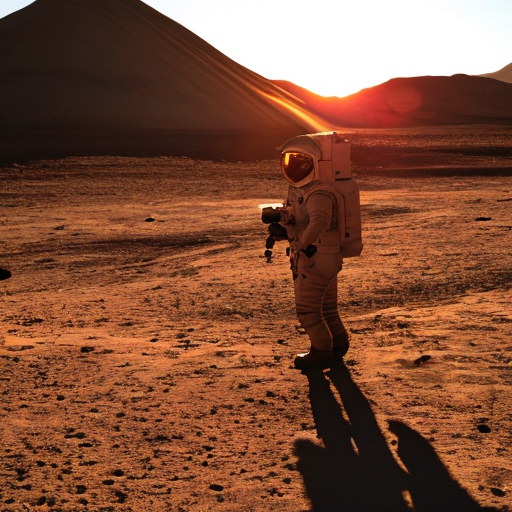

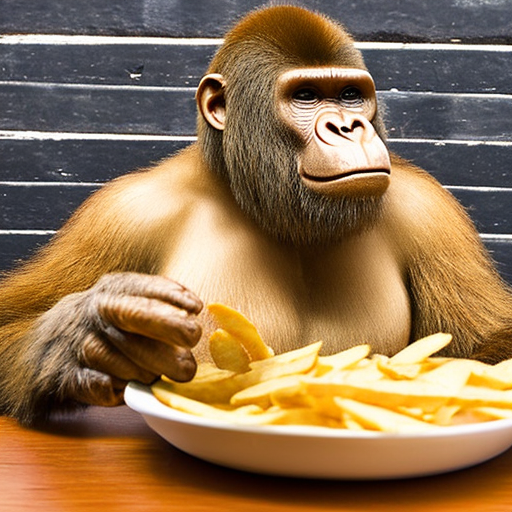

In [219]:
for img in images: display(mk_img(img))

## Implement Diffuser Class

The above functions work quite nicely, although the negative prompts could use a little work. At the moment we can only specify one negative prompt per batch of images. In most cases, that is fine anyway. For example, generally, we'd always want to avoid deformed images. 

Let's put all the pieces together into a class:

In [220]:
class Diffuser:
    """
    A class representing a text-to-image diffusion model.
    
    Args:
        prompts (list[str]): List of text prompts.
        negative_prompt (list[str], optional): Negative text prompt (a single string only). Default is an empty string.
        guidance (float, optional): Guidance for diffusion process. Default is 7.5.
        seed (int, optional): Random seed for reproducibility. Default is 100.
        steps (int, optional): Number of diffusion steps. Default is 70.
        width (int, optional): Width of the output image. Default is 512.
        height (int, optional): Height of the output image. Default is 512.
    """
    
    def __init__(self, prompts, negative_prompt=[''], guidance=7.5, seed=100, steps=70, width=512, height=512):
        self.prompts = prompts
        self.bs = len(prompts)
        self.negative_prompt = negative_prompt
        self.guidance = guidance
        self.seed = seed
        self.steps = steps
        self.w = width
        self.h = height
  
    def diffuse(self, progress=0): # Progress indicator. Default is 0.
        embs = self.set_embs()
        lats = self.set_lats()
        for i, ts in enumerate(tqdm(scheduler.timesteps)): lats = self.denoise(lats, embs, ts)
        return self.decompress_lats(lats)
  
    def set_embs(self):
        txt_inp = self.tokenizer_seq(self.prompts)
        neg_inp = self.tokenizer_seq(self.negative_prompt * len(self.prompts))

        txt_embs = self.make_embs(txt_inp['input_ids'])
        neg_embs = self.make_embs(neg_inp['input_ids'])
        return torch.cat([neg_embs, txt_embs])
  
    def tokenizer_seq(self, prompts, max_len=None):
        if max_len is None: max_len = tokenizer.model_max_length
        return tokenizer(prompts, padding='max_length', max_length=max_len, truncation=True, return_tensors='pt')    
  
    def make_embs(self, input_ids):
        return text_encoder(input_ids.to(device))[0].half()

    def set_lats(self):
        torch.manual_seed(self.seed)
        lats = torch.randn((self.bs, unet.config.in_channels, self.h//8, self.w//8))
        scheduler.set_timesteps(self.steps)
        return lats.to(device).half() * scheduler.init_noise_sigma

    def denoise(self, latents, embeddings, timestep):
        inp = scheduler.scale_model_input(torch.cat([latents]*2), timestep)
        with torch.no_grad(): pred_neg, pred_txt = unet(inp, timestep, encoder_hidden_states=embeddings).sample.chunk(2)
        pred = pred_neg + self.guidance * (pred_txt - pred_neg)
        return scheduler.step(pred, timestep, latents).prev_sample

    def decompress_lats(self, latents):
        with torch.no_grad(): imgs = vae.decode(1/0.18215*latents).sample
        imgs = (imgs / 2 + 0.5).clamp(0, 1)
        imgs = [img.detach().cpu().permute(1, 2, 0).numpy() for img in imgs]
        return [(img*255).round().astype('uint8') for img in imgs]

    def update_params(self, **kwargs):
        allowed_params = ['prompts', 'negative_prompt', 'guidance', 'seed', 'steps', 'width', 'height']
        for k, v in kwargs.items():
            if k not in allowed_params:
                raise ValueError(f"Invalid parameter name: {k}")
        if k == 'prompts':
            self.prompts = v
            self.bs = len(v)
        else:
            setattr(self, k, v)


In [221]:
prompts = [
    'A spaceman with Martian sunset in the background',
    'A great ape eating a plate of chips. Realistic fur.'
]
negative_prompt = ['deformed iris, deformed pupils, semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime, \
                    text, cropped, out of frame, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, \
                    extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, \
                    bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, \
                    missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck'
]

  0%|          | 0/70 [00:00<?, ?it/s]

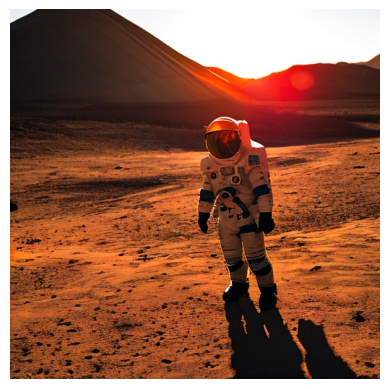

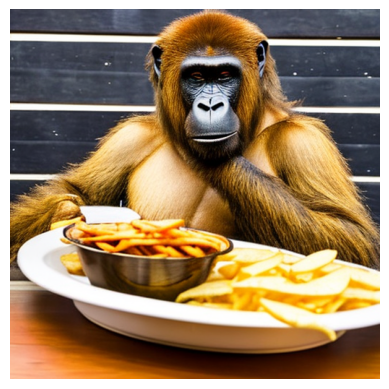

In [222]:
# Create an instance of the Diffuser class
diffuser = Diffuser(prompts, negative_prompt)

# Perform diffusion
result_images = diffuser.diffuse()

for img_array in result_images:
    plt.imshow(img_array)
    plt.axis('off')
    plt.show()

## Latents and callbacks

Stable Diffusion is based on a particular type of diffusion model called **Latent Diffusion**, proposed in [High-Resolution Image Synthesis with Latent Diffusion Models](https://arxiv.org/abs/2112.10752).

General diffusion models are machine learning systems that are trained to *denoise* random gaussian noise step by step, to get to a sample of interest, such as an *image*. For a more detailed overview of how they work, check [this colab](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb).

Diffusion models have shown to achieve state-of-the-art results for generating image data. But one downside of diffusion models is that the reverse denoising process is slow. In addition, these models consume a lot of memory because they operate in pixel space, which becomes unreasonably expensive when generating high-resolution images. Therefore, it is challenging to train these models and also use them for inference.

Latent diffusion can reduce the memory and compute complexity by applying the diffusion process over a lower dimensional _latent_ space, instead of using the actual pixel space. This is the key difference between standard diffusion and latent diffusion models: **in latent diffusion the model is trained to generate latent (compressed) representations of the images.** 

The Stable Diffusion pipeline can send intermediate latents to a callback function we provide. By running these latents through the image decoder, we can see how the denoising process progresses and the image unfolds.

### Implement callbacks

For the next part of the FastAI 'homework', let's implement callbacks. We'll modify Diffuser.diffuse() to output the latent at a pre-specified interval. A big thank you to ForBo7 for the key ideas here.

See: [ForBo7 blog post](https://forbo7.github.io/forblog/posts/13_implementing_stable_diffusion_from_its_components.html)

In [223]:
def diffuse_with_callback(self, interval=0):
    """
    Diffuses the input text prompts to generate images using a pre-trained diffusion model.
    
    Parameters:
        interval (int, optional): Specifies the interval for displaying image callbacks.
    
    Returns:
        torch.Tensor: Image samples generated based on the input prompts.
    """
    embs = self.set_embs()
    lats = self.set_lats()
    
    if interval > 0: # Check if callbacks are needed.
        row = [] 
        for i, ts in enumerate(tqdm(scheduler.timesteps)):
            lats = self.denoise(lats, embs, ts)
            # Check if desired interval is reached.
            # If the current loop number matches the interval, it should divide the interval cleanly.
            if (i % interval) == 0: 
                row.append(self.decompress_lats(lats)[0])
  
        row = np.concatenate(row, axis=1) # Place all images into one long line.
        display(Image.fromarray(row))

    else:
        for i, ts in enumerate(tqdm(scheduler.timesteps)):
            lats = self.denoise(lats, embs, ts)
    
    return self.decompress_lats(lats)


In [224]:
prompts = ['A spaceman with Martian sunset in the background']
negative_prompt = ['deformed, anime, cartoon, art']

  0%|          | 0/70 [00:00<?, ?it/s]

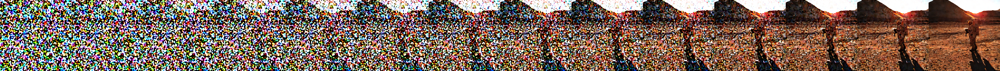

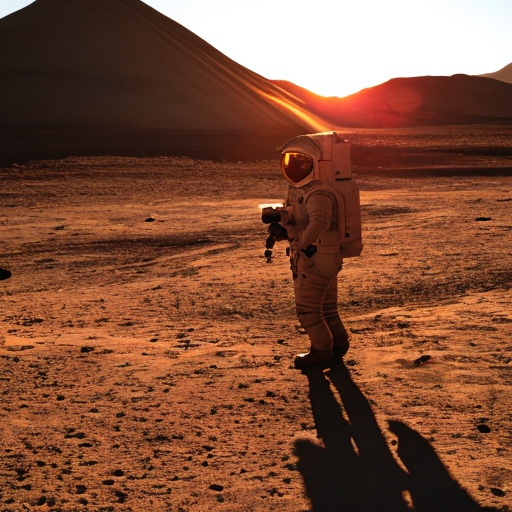

In [225]:
# Create an instance of the Diffuser class
diffuser = Diffuser(prompts, negative_prompt)

# Replace the existing diffuse method with the new diffuse_and_callback method.
diffuser.diffuse = diffuse_with_callback.__get__(diffuser, Diffuser)

# Perform diffusion
result_images = diffuser.diffuse(interval=5)[0]

Image.fromarray(result_images)

# Summary

We've implemented a text-to-image diffusion model capable of generating images from prompts. The model incorporates several features:

* Classifier-Free Guidance: Using a pre-trained classifier, the model generates images based on the prompt, with the degree of alignment to the prompt controlled by the guidance scale.

* Negative Prompting: Enables the generation of images that avoid specific attributes mentioned in the prompt. This feature adds some additional control over the image generation process.

* Callbacks for Visualization: Allows for periodic visualization of the generated images during the diffusion process, enabling feedback and monitoring of image generation.